### Importando as bibliotecas

In [1]:
import pandas as pd
import numpy as np

### Carregando as datasets

Para saber mais sobre datasets, acesse: [Spotify API](https://developer.spotify.com/documentation/web-api/reference/#/operations/get-several-audio-features)

In [2]:
dados = pd.read_csv('Dados/Dados_totais.csv')
dados_generos = pd.read_csv('Dados/data_by_genres.csv')
dados_anos = pd.read_csv('Dados/data_by_year.csv')

#### Verificando dataset 'dados'

In [3]:
dados.head(3)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,0.0584,105.143,Linkin Park - In the End


In [4]:
# Verificando os valores únicos da coluna ano.
dados['year'].unique()

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020],
      dtype=int64)

In [5]:
# Verificando o tamanho da dataset.
dados.shape

(20311, 19)

In [6]:
# Deletando as colunas que não serão utilizadas.
dados.drop(columns=['explicit','key','mode'], axis=1, inplace=True)
dados.head(3)

,valence,year,acousticness,artists,danceability,duration_ms,energy,id,instrumentalness,liveness,loudness,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,3AJwUDP919kvQ9QcozQPxg,0.000121,0.2340,-7.227,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,0I3q5fE6wg7LIfHGngUTnV,0.000000,0.0771,-5.946,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,60a0Rd6pjrkxjPbaKzXjfq,0.000000,0.2090,-5.870,In the End,84,0.0584,105.143,Linkin Park - In the End


In [7]:
# Verificando se há valores nulos.
dados.isna().sum()

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
id                  0
instrumentalness    0
liveness            0
loudness            0
name                0
popularity          0
speechiness         0
tempo               0
artists_song        0
dtype: int64

#### Verificando dataset 'dados_generos'

In [8]:
dados_generos.head(3)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.3616,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.1310,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.1260,-9.180000,0.047000,133.444000,0.975000,48.000000,7


In [9]:
# Deletando as colunas que não serão utilizadas.
dados_generos.drop(columns=['key','mode'], axis=1, inplace=True)
dados_generos.head(3)

,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.3616,-31.514333,0.040567,75.336500,0.103783,27.833333
1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.1310,-16.854000,0.076817,120.285667,0.221750,52.500000
2,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.1260,-9.180000,0.047000,133.444000,0.975000,48.000000


#### Verificando dataset 'dados_anos'

In [10]:
dados_anos.head(3)

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,1921,0.886896,0.418597,260537.166667,0.231815,0.344878,0.205710,-17.048667,0.073662,101.531493,0.379327,0.653333,2
1,1,1922,0.938592,0.482042,165469.746479,0.237815,0.434195,0.240720,-19.275282,0.116655,100.884521,0.535549,0.140845,10
2,1,1923,0.957247,0.577341,177942.362162,0.262406,0.371733,0.227462,-14.129211,0.093949,114.010730,0.625492,5.389189,0


In [11]:
# Verificando os valores únicos da coluna ano.
dados_anos['year'].unique()

array([1921, 1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931,
       1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942,
       1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953,
       1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964,
       1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975,
       1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986,
       1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       2020], dtype=int64)

In [12]:
# Atrivbuindo a dataset com os anos a partir de 2000.
dados_anos = dados_anos[dados_anos['year'] >=2000]
dados_anos['year'].unique()

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020],
      dtype=int64)

In [13]:
# Deletando as colunas que não serão utilizadas.
dados_anos.drop(columns=['key','mode'], axis=1, inplace=True)
dados_anos.reset_index(inplace=True)
dados_anos.head(3)

,index,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,79,2000,0.289323,0.590918,242724.642638,0.625413,0.101168,0.197686,-8.247766,0.089205,118.999323,0.559475,46.684049
1,80,2001,0.286842,0.583318,240307.796010,0.626986,0.107214,0.187026,-8.305095,0.089182,117.765399,0.541479,48.750125
2,81,2002,0.282624,0.576160,239503.283000,0.641270,0.088048,0.193911,-7.686640,0.084308,119.239738,0.542397,48.655500


### Análise Gráfica

In [14]:
import plotly.express as px

# Verificando o loudness ao longo dos anos.
fig = px.line(dados_anos, x='year', y='loudness', markers = True, title='Loudness ao longo dos anos')
fig.show()

In [15]:
# Verificando cada característica ao longo dos anos.
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['acousticness'], mode='lines+markers', name='Acousticness'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['valence'], mode='lines+markers', name='Valence'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['danceability'], mode='lines+markers', name='Danceability'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['energy'], mode='lines+markers', name='Energy'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['instrumentalness'], mode='lines+markers', name='Instrumentalness'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['liveness'], mode='lines+markers', name='Liveness'))
fig.add_trace(go.Scatter(x=dados_anos['year'], y=dados_anos['speechiness'], mode='lines+markers', name='Speechiness'))

### Verificando a correlação entre as variáveis

In [16]:
# Verificando a correlação entre as variáveis.
numeric_columns = dados.select_dtypes(include=[np.number]).columns
matriz_correlacao = dados[numeric_columns].corr()

fig = px.imshow(matriz_correlacao, text_auto=True)
fig.show()

### Preparando o dataframe para aplicar PCA e StandardScaler

In [17]:
# Verificando dataframe de gênero musical.
dados_generos

,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333
1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000
2,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000
3,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882
4,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071
...,...,...,...,...,...,...,...,...,...,...,...,...
2968,zolo,0.222625,0.547082,2.580991e+05,0.610240,0.143872,0.204206,-11.295878,0.061088,125.494919,0.596155,33.778943
2969,zouglou,0.161000,0.863000,2.063200e+05,0.909000,0.000000,0.108000,-5.985000,0.081300,119.038000,0.845000,58.000000
2970,zouk,0.263261,0.748889,3.060728e+05,0.622444,0.257227,0.089678,-10.289222,0.038778,101.965222,0.824111,46.666667
2971,zurich indie,0.993000,0.705667,1.984173e+05,0.172667,0.468633,0.179667,-11.453333,0.348667,91.278000,0.739000,0.000000


In [18]:
# Criando novo dataframe sem coluna 'genre'.
dados_generos_v1 = dados_generos.drop('genres', axis=1)
dados_generos_v1

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333
1,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000
2,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000
3,0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882
4,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071
...,...,...,...,...,...,...,...,...,...,...,...
2968,0.222625,0.547082,2.580991e+05,0.610240,0.143872,0.204206,-11.295878,0.061088,125.494919,0.596155,33.778943
2969,0.161000,0.863000,2.063200e+05,0.909000,0.000000,0.108000,-5.985000,0.081300,119.038000,0.845000,58.000000
2970,0.263261,0.748889,3.060728e+05,0.622444,0.257227,0.089678,-10.289222,0.038778,101.965222,0.824111,46.666667
2971,0.993000,0.705667,1.984173e+05,0.172667,0.468633,0.179667,-11.453333,0.348667,91.278000,0.739000,0.000000


In [19]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Definindo SEED para que os resultados sejam reproduzíveis.
np.random.seed(1224)
SEED = 1224

# Criando o pipeline para o PCA de forma automatizada: Padronizando os dados com StandardScaler() e reduzindo a dimensionalidade com PCA().
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('pca', PCA(n_components=2, random_state=SEED))])

In [20]:
# Aplicando o pipeline no dataframe de gênero.
genre_embeddings_pca = pca_pipeline.fit_transform(dados_generos_v1)

# Criando um dataframe com os dados transformados.
projection = pd.DataFrame(data=genre_embeddings_pca, columns=['x', 'y'])
projection

,x,y
0,5.910268,-0.011146
1,2.787093,4.498483
2,-0.757538,-1.258495
3,1.020521,-0.931690
4,0.753911,-0.999861
...,...,...
2968,-0.475136,-0.017126
2969,-3.026756,-1.304983
2970,-0.832511,-1.089726
2971,1.774790,-3.695233


### Clusterização por gênero: Implementação do K-Means

In [21]:
from sklearn.cluster import KMeans

# Instanciando o KMeans com 5 clusters.
kmeans_pca = KMeans(n_clusters=5, verbose=False, random_state=SEED)

# Treinando o modelo.
kmeans_pca.fit(projection)

dados_generos['cluster_pca'] = kmeans_pca.predict(projection) # Adicionando a coluna de cluster na dataset dados_generos.
projection['cluster_pca'] = kmeans_pca.predict(projection) # Adicionando a coluna de cluster na dataset projection.
projection['genres'] = dados_generos['genres'] # Adicionando a coluna de gêneros na dataset projection.

c:\Users\natsu\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [22]:
# Verificando os gêneros de cluster 1.
projection[projection['cluster_pca'] == 1]

,x,y,cluster_pca,genres
10,-1.165653,0.624582,1,acid house
12,-2.171712,0.621886,1,acid trance
18,-1.487801,0.635489,1,action rock
35,-0.944163,0.635909,1,afrofuturismo brasileiro
38,-1.345835,0.926155,1,aggrotech
...,...,...,...,...
2939,-0.988275,2.511451,1,women's choir
2948,-1.983068,0.577710,1,wrestling
2950,-2.507249,0.769146,1,wyoming indie
2953,-1.913241,1.096748,1,xtra raw


In [23]:
# Visualizando os clusters em um gráfico.
fig = px.scatter(projection, x='x', y='y', color='cluster_pca', hover_data=['genres'])
fig.update_layout(title='Clusters de gêneros musicais')
fig.show()

In [24]:
# Verificando a soma das porcentagens de variância explicada por todos os componentes principais.
pca_pipeline[1].explained_variance_ratio_.sum()

0.4927066994726641

In [25]:
# Verificando a soma das variâncias explicadas por todos os componentes principais.
pca_pipeline[1].explained_variance_.sum()

5.421597305805697

### Clusterização por música

In [26]:
dados.head(3)

,valence,year,acousticness,artists,danceability,duration_ms,energy,id,instrumentalness,liveness,loudness,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,3AJwUDP919kvQ9QcozQPxg,0.000121,0.2340,-7.227,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,0I3q5fE6wg7LIfHGngUTnV,0.000000,0.0771,-5.946,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,60a0Rd6pjrkxjPbaKzXjfq,0.000000,0.2090,-5.870,In the End,84,0.0584,105.143,Linkin Park - In the End


In [27]:
# Verificando a quantidade de artistas no dataset.
dados['artists'].value_counts()

artists
Drake                   170
Taylor Swift            156
Eminem                  147
Kanye West              136
BTS                     122
                       ... 
Of Monsters and Men       7
The Living Tombstone      7
Clean Bandit              7
Nelly Furtado             6
Empire of the Sun         6
Name: count, Length: 875, dtype: int64

In [28]:
# Verificando as músicas existentes no dataset.
dados['artists_song']

0                         Coldplay - Yellow
1                     OutKast - Ms. Jackson
2                  Linkin Park - In the End
3                 3 Doors Down - Kryptonite
4              Eminem - The Real Slim Shady
                        ...                
20306        Bazzi - I Don't Think I'm Okay
20307    Bryson Tiller - Timeless Interlude
20308                Fleet Foxes - Sunblind
20309        Gunna - NASTY GIRL / ON CAMERA
20310                     Eminem - Darkness
Name: artists_song, Length: 20311, dtype: object

### Transformando os dados 

In [29]:
# Transformando os dados da coluna 'artists'.
from sklearn.preprocessing import OneHotEncoder

# Instanciando o encoder.
ohe = OneHotEncoder(dtype=int)

# Aplicando o encoder.
colunas_ohe = ohe.fit_transform(dados[['artists']]).toarray()

# Criando um dataframe com os dados transformados, sem a coluna 'artists'.
dados_v1 = dados.drop('artists', axis=1)

# Concatenando os dataframes.
dados_musicas_dummies = pd.concat([dados_v1, pd.DataFrame(colunas_ohe, columns= ohe.get_feature_names_out(['artists']))], axis=1)
dados_musicas_dummies

,valence,year,acousticness,danceability,duration_ms,energy,id,instrumentalness,liveness,loudness,...,artists_Zara Larsson,artists_Zedd,artists_alt-J,artists_blackbear,artists_blink-182,artists_deadmau5,artists_for KING & COUNTRY,artists_fun.,artists_girl in red,artists_iann dior
0,0.285,2000,0.00239,0.429,266773,0.661,3AJwUDP919kvQ9QcozQPxg,0.000121,0.2340,-7.227,...,0,0,0,0,0,0,0,0,0,0
1,0.613,2000,0.14300,0.843,270507,0.806,0I3q5fE6wg7LIfHGngUTnV,0.000000,0.0771,-5.946,...,0,0,0,0,0,0,0,0,0,0
2,0.400,2000,0.00958,0.556,216880,0.864,60a0Rd6pjrkxjPbaKzXjfq,0.000000,0.2090,-5.870,...,0,0,0,0,0,0,0,0,0,0
3,0.543,2000,0.00664,0.545,233933,0.865,6ZOBP3NvffbU4SZcrnt1k6,0.000011,0.1680,-5.708,...,0,0,0,0,0,0,0,0,0,0
4,0.760,2000,0.03020,0.949,284200,0.661,3yfqSUWxFvZELEM4PmlwIR,0.000000,0.0454,-4.244,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20306,0.187,2020,0.57400,0.445,176250,0.330,0PUkanqCGTb6qseXPKOw1F,0.000000,0.1020,-8.121,...,0,0,0,0,0,0,0,0,0,0
20307,0.240,2020,0.81500,0.467,179188,0.429,6Iw6fQVKZi0fWtEQBrTFcP,0.000052,0.1770,-8.689,...,0,0,0,0,0,0,0,0,0,0
20308,0.466,2020,0.31000,0.562,253613,0.686,308prODCCD0O660tIktbUi,0.022500,0.1250,-8.480,...,0,0,0,0,0,0,0,0,0,0
20309,0.522,2020,0.20400,0.598,230600,0.472,2f8y4CuG57UJEmkG3ujd0D,0.000015,0.1080,-10.991,...,0,0,0,0,0,0,0,0,0,0


In [30]:
# Gerando um novo pipeline.
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('pca', PCA(n_components=0.7, random_state=SEED))]) # 70% de taxa de aprendizado.

# Aplicando o pipeline no dataframe de músicas.
music_embeddings_pca = pca_pipeline.fit_transform(dados_musicas_dummies.drop(['artists_song', 'name', 'id'], axis=1))

# Criando um dataframe com os dados transformados.
projection_m = pd.DataFrame(data=music_embeddings_pca)


In [31]:
# Contando a quantidade de componentes principais gerados pelo PCA.
pca_pipeline[1].n_components_

612

In [32]:
# Instanciando KMeans
kmeans_pca_pipeline = KMeans(n_clusters=45, verbose=False, random_state=SEED)

# Treinando o modelo
kmeans_pca_pipeline.fit(projection_m)

dados['cluster_pca'] = kmeans_pca_pipeline.predict(projection_m) # Adicionando a coluna de cluster na dataset dados_generos.
projection_m['cluster_pca'] = kmeans_pca_pipeline.predict(projection_m) # Adicionando a coluna de cluster na dataset projection.

c:\Users\natsu\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [33]:
# Gerando novas colunas no dataframe projection_m
projection_m['artist'] = dados['artists']
projection_m['song'] = dados['artists_song']
projection_m

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,cluster_pca,artist,song
0,0.174796,0.731252,2.186797,-0.767192,0.594847,0.315968,-0.412322,-0.479171,-2.700668,2.109956,...,-0.009111,0.005154,-0.034027,-0.032617,-1.011328e-12,8.702118e-13,1.301007e-12,20,Coldplay,Coldplay - Yellow
1,-1.358420,0.052935,-1.789973,1.938444,0.403606,1.023898,-1.172118,0.821698,-1.716897,0.252498,...,-0.031986,0.029708,-0.016322,-0.030234,2.342492e-13,-1.809336e-12,-8.082819e-13,20,OutKast,OutKast - Ms. Jackson
2,-0.972077,0.658094,0.757500,-0.277350,-0.400393,0.402941,1.292960,1.839192,-1.562236,1.410677,...,0.017097,0.017361,-0.010979,-0.012781,-1.326919e-13,2.282674e-13,-5.137273e-15,20,Linkin Park,Linkin Park - In the End
3,-0.926464,1.292091,0.398499,-0.997738,0.202219,0.620859,-0.527689,1.135529,-1.343893,1.020964,...,0.089337,0.164777,-0.064148,-0.040911,-5.045316e-12,2.723730e-13,4.783494e-12,20,3 Doors Down,3 Doors Down - Kryptonite
4,-1.710077,-0.383502,-1.258562,1.346428,1.223591,1.744579,0.094311,0.479412,-2.125376,0.389565,...,-0.011937,-0.004081,-0.017478,-0.010033,-2.603075e-14,-1.866575e-13,-1.303851e-13,0,Eminem,Eminem - The Real Slim Shady
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20306,1.346699,-2.775889,0.986755,-1.704967,0.103935,-0.726582,0.253808,0.520234,-0.064513,0.204971,...,-0.235355,-0.054256,0.016922,-0.125947,4.582466e-12,-2.586535e-12,-5.936110e-12,20,Bazzi,Bazzi - I Don't Think I'm Okay
20307,1.269387,-2.444619,0.971408,-0.115303,-0.719597,-1.823579,-0.545186,-1.475719,-0.338390,0.272129,...,-0.183026,0.074605,0.005622,0.000054,1.690201e-12,4.460557e-12,-3.407012e-12,20,Bryson Tiller,Bryson Tiller - Timeless Interlude
20308,0.781916,-1.164865,0.705256,-0.947160,1.145828,-0.472667,-0.356604,0.972512,0.900317,-0.674016,...,-0.033420,-0.157564,0.213849,-0.065180,-1.036781e-11,-2.984064e-12,-6.584126e-12,20,Fleet Foxes,Fleet Foxes - Sunblind
20309,0.002454,-3.056407,-0.272934,1.436355,-0.604453,0.251492,-1.361710,-0.633245,0.280076,0.521145,...,-0.784640,0.080684,0.038379,0.108493,-3.398985e-13,1.351103e-11,7.353448e-12,20,Gunna,Gunna - NASTY GIRL / ON CAMERA


In [34]:
# Visualizando os clusters em gráfico 3D.
fig = px.scatter_3d(
   projection_m, x=0, y=1, z=2, color='cluster_pca',hover_data=['song'])
fig.update_traces(marker_size = 2)
fig.show()

In [35]:
# Verificando a soma das porcentagens de variância explicada por todos os componentes principais.
pca_pipeline[1].explained_variance_ratio_.sum()

0.700000846318703

In [36]:
# Verificando a soma das variâncias explicadas por todos os componentes principais.
pca_pipeline[1].explained_variance_.sum()

620.9313218688692

## Criando sistema de recomendação

#### Recomendação de música

In [44]:
from sklearn.metrics.pairwise import euclidean_distances

# Definindo o nome da música a ser localizado.
nome_musica = 'Evanescence - My Immortal'

# Pegando o cluster da música.
cluster = list(projection_m[projection_m['song'] == nome_musica]['cluster_pca'])[0]

# Pegando as músicas do mesmo cluster.
musicas_recomendadas = projection_m[projection_m['cluster_pca'] == cluster][[0,1,'song']]
# Pegando a posição x da música.
x_musica = list(projection_m[projection_m['song'] == nome_musica][0])[0]
# Pegando a posição y da música. 
y_musica = list(projection_m[projection_m['song'] == nome_musica][1])[0] 

# Calculando a distância euclidiana entre as músicas.
distancia = euclidean_distances(musicas_recomendadas[[0,1]], [[x_musica, y_musica]])

# Criando um dataframe com as músicas recomendadas.
musicas_recomendadas['id'] = dados['id']
musicas_recomendadas['distancia'] = distancia

# Ordenando as 10 músicas pela distância.
recomendada = musicas_recomendadas.sort_values(by='distancia').head(10)
recomendada

,0,1,song,id,distancia
419,2.878001,0.423889,Evanescence - My Immortal,4UzVcXufOhGUwF56HT7b8M,0.000000
17694,2.877142,0.440938,The Beatles - While My Guitar Gently Weeps,0FzGKD3N0jK6nNOyOJBvNG,0.017071
16339,2.855464,0.438306,Gorillaz - Cloud of Unknowing (feat. Bobby Wom...,0NDOVMOT6ah2k6HuXLrq5x,0.026754
8267,2.837523,0.410403,John Prine - Long Monday,5mQsvob7sHv2vRhRkTXOvl,0.042666
16024,2.871064,0.378189,Radiohead - Last Flowers,7Ceo3Rpq33Vc5WcOb3tUbT,0.046223
10413,2.937480,0.411308,Alan Jackson - How Great Thou Art,1mGQuFssuBEYYo2ZydhTeT,0.060795
19519,2.812194,0.432642,Vampire Weekend - I Think Ur A Contra,6DBKSzHJnmessG6SimxooQ,0.066386
8407,2.856670,0.497987,The Avett Brothers - The Ballad of Love and Hate,49YQ9Mq8CKelQsmjdNiICu,0.077107
15817,2.936683,0.366747,Iron & Wine - Passing Afternoon,4mRLQVrkJqNjvBxMXSQ53X,0.081907
12470,2.958831,0.438309,Josh Groban - Little Drummer Boy,0Znrkkl2NYC2AEbgEbENSO,0.082107


In [38]:
# Importando bibliotecas para autenticação na API do Spotify.
import spotipy
from spotipy.oauth2 import SpotifyOAuth
from spotipy.oauth2 import SpotifyClientCredentials
from dotenv import dotenv_values

# Carregando as variáveis de ambiente do arquivo .env
env_vars = dotenv_values('.env')

# Obtendo o client_id e client_secret
client_id = env_vars['client_id']
client_secret = env_vars['client_secret']

# Autenticando na API do Spotify.
scope = 'user-library-read playlist-modify-private'
OAuth = SpotifyOAuth(
        scope=scope, 
        client_id=client_id, 
        client_secret=client_secret, 
        redirect_uri='http://localhost:8080')

client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)

# Instanciando o objeto Spotify.
sp = spotipy.Spotify(client_credentials_manager=client_credentials_manager) 

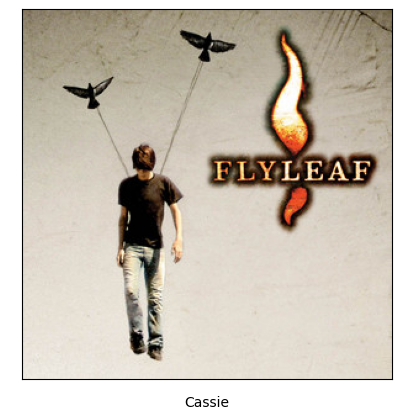

In [39]:
import matplotlib.pyplot as plt
from skimage import io

# Localizando o ID da música
nome_musica = 'Flyleaf - Cassie'
id = dados[dados['artists_song'] == nome_musica]['id'].iloc[0]

# Fazendo a requisição da imagem e do nome da música.
track = sp.track(id)
url = track['album']['images'][1]['url']
name = track['name']

# Plotando a imagem do álbum.
image = io.imread(url, as_gray=False)
plt.imshow(image)
plt.xlabel(name, fontsize=10)
plt.xticks(color = 'w', fontsize=0.1)
plt.yticks(color = 'w', fontsize=0.1)
plt.tick_params(bottom = False, left= False)
plt.show()
plt.close()

In [40]:
def recommend_id(playlist_id):
    """
    Função que recebe uma lista de IDs de músicas e retorna os nomes, URLs das imagens dos álbuns e artistas correspondentes.

    Parâmetros:
    - playlist_id: lista de IDs de músicas.

    Retorno:
    - name: lista com os nomes das músicas.
    - url: lista com as URLs das imagens dos álbuns.
    - artists: lista com os nomes dos artistas.
    """
    
    url = []
    name = []
    artists = []
    for i in playlist_id:
        track = sp.track(i)
        url.append(track['album']['images'][1]['url'])
        name.append(track['name'])
        artists.append(track['artists'][0]['name'])
    return name, url, artists

name, url, artists = recommend_id(recomendada['id'])


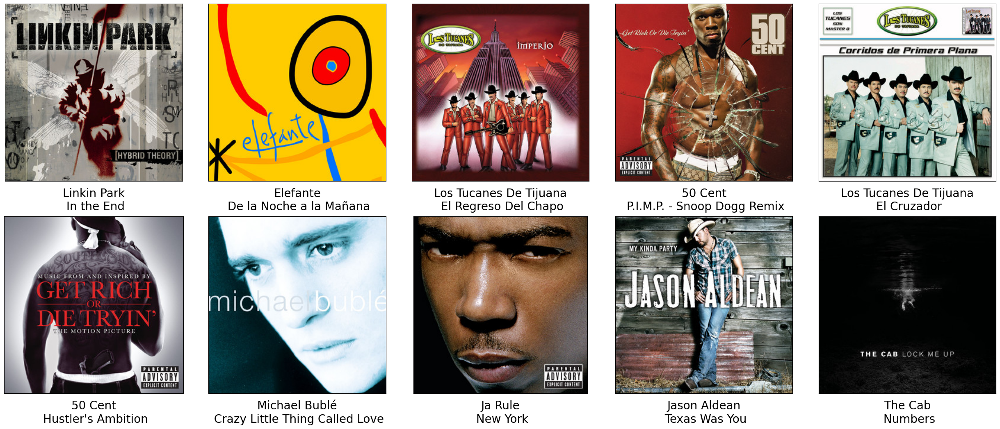

In [41]:
def plotar_imagens(name, url, artists):
    """
    Plota as imagens dos álbuns das músicas recomendadas.

    Parâmetros:
    - name: lista com os nomes das músicas.
    - url: lista com as URLs das imagens dos álbuns.
    - artists: lista com os nomes dos artistas.
    """
    
    plt.figure(figsize=(25, 15))
    columns = 5
    for i, u in enumerate(url):
        ax = plt.subplot(len(url) // columns + 1, columns, i + 1)

        image = io.imread(u)
        ax.imshow(image)

        ax.get_yaxis().set_visible(False)

        plt.xticks(color='w', fontsize=0.1)
        plt.yticks(color='w', fontsize=0.1)
        plt.xlabel(f"{artists[i]}\n {name[i]}", fontsize=20)
        plt.tight_layout(h_pad=0.7, w_pad=0.7)
        plt.subplots_adjust(wspace=None, hspace=None)
        plt.tick_params(bottom=False)
        plt.grid(visible=None, which='major', axis='y')
    plt.show()

plotar_imagens(name, url, artists)

In [42]:

def recomendador(nome_musica):
  """
  Função que recomenda músicas similares com base em uma música de referência.

  Parâmetros:
  - nome_musica: o nome da música de referência.

  Retorno:
  - 10 músicas recomendadas
  """

  # Calculando as distâncias
  cluster = list(projection_m[projection_m['song'] == nome_musica]['cluster_pca'])[0]
  musicas_recomendadas = projection_m[projection_m['cluster_pca'] == cluster][[0, 1, 'song']]
  x_musica = list(projection_m[projection_m['song'] == nome_musica][0])[0]
  y_musica = list(projection_m[projection_m['song'] == nome_musica][1])[0]
  distancias = euclidean_distances(musicas_recomendadas[[0, 1]], [[x_musica, y_musica]])
  musicas_recomendadas['id'] = dados['id']
  musicas_recomendadas['distancias'] = distancias
  recomendada = musicas_recomendadas.sort_values('distancias').head(10)

  # Acessando os dados de cada música com a biblioteca Spotipy (nome e imagem)
  playlist_id = recomendada['id']

  url = []
  name = []
  artists = []
  for i in playlist_id:
    track = sp.track(i)
    url.append(track["album"]["images"][1]["url"])
    name.append(track["name"])
    artists.append(track['artists'][0]['name'])
  
  # Plotando as figuras
  plt.figure(figsize=(15, 10))
  columns = 5
  for i, u in enumerate(url):
    ax = plt.subplot(len(url) // columns + 1, columns, i + 1)
    image = io.imread(u)
    plt.imshow(image)
    ax.get_yaxis().set_visible(False)
    plt.xticks(color='w', fontsize=0.1)
    plt.yticks(color='w', fontsize=0.1)
    plt.xlabel(f"{artists[i]}\n{name[i]}", fontsize=10)
    plt.tight_layout(h_pad=0.7, w_pad=0)
    plt.subplots_adjust(wspace=None, hspace=None)
    plt.grid(visible=None, which='major', axis='y')
    plt.tick_params(bottom=False)
  plt.show()

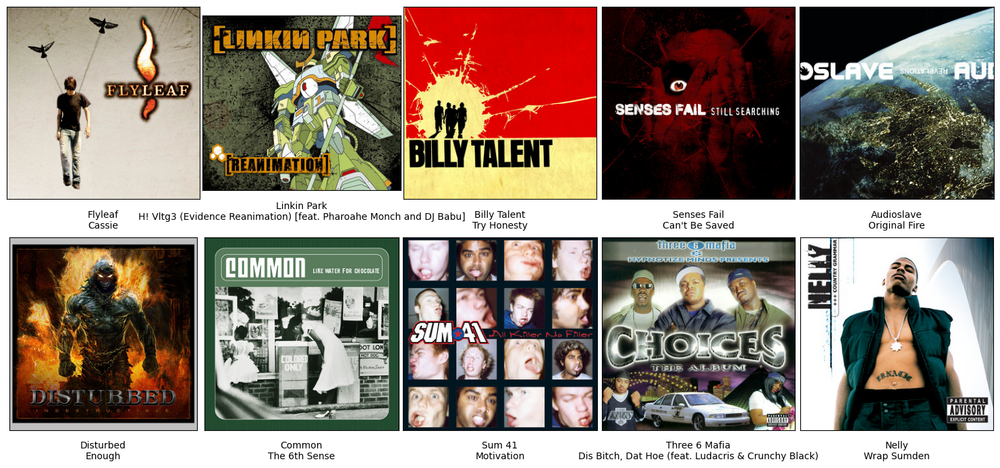

In [47]:
recomendador(input('Digite o nome do artista e música:\nEx: Artista - Música\n'))